# Set env

In [1]:
# Установка зависимостей
!wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
!sudo unzip ninja-linux.zip -d /usr/local/bin/
!sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

!pip install ftfy regex tqdm lmdb
!pip install git+https://github.com/openai/CLIP.git

# Импорт нужных библиотек
import os
import shutil
import sys
import functools
import operator
from argparse import Namespace
from tqdm import notebook
from IPython.display import display
from pydantic import BaseModel

import math
import random
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.autograd import Function
import torch.optim as optim
from torchvision import transforms
from torchvision import utils

import clip
from PIL import Image
import cv2
import dlib

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Клонирование репозитория restyle для инверсии
!git clone https://github.com/yuval-alaluf/restyle-encoder.git

# Клонируем мой репозиторий
!git clone https://github.com/alexandraizhevskaya/image_editing.git

In [2]:
# add paths
sys.path.append('/content/restyle-encoder')
sys.path.append('/content/image_editing')
sys.path.append('/content/image_editing/stylegan2')

In [3]:
# custom imports
from src.utils import load_weights
from src.train_config import TrainParams

from src.model import Net
from src.inference import inference_model_on_generated
from src.inference import load_encoder
from src.inference import inference_model_on_real

/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not d

In [4]:
# set device
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

# set seed
SEED = 7
torch.manual_seed(SEED)
np.random.seed(SEED)

In [5]:
# load stylegan2, clip and detector weights via pydrive
load_weights()

In [5]:
# load encoder
restyle_net, opts, restyle_experiment_args = load_encoder(encoder_type='e4e')

Loading ReStyle e4e from checkpoint: restyle_e4e_ffhq_encode.pt
Model successfully loaded!


In [ ]:
# https://drive.google.com/file/d/15zkZqUlfYQ4-Yy2C35b4Cw7SfxCNiHYU/view?usp=sharing

In [7]:
# Load weights of the trained model
! gdown https://drive.google.com/uc?id=15zkZqUlfYQ4-Yy2C35b4Cw7SfxCNiHYU


Downloading...
From (original): https://drive.google.com/uc?id=15zkZqUlfYQ4-Yy2C35b4Cw7SfxCNiHYU
From (redirected): https://drive.google.com/uc?id=15zkZqUlfYQ4-Yy2C35b4Cw7SfxCNiHYU&confirm=t&uuid=3f996a0a-5e25-45e1-a6a6-20bcdec355ee
To: /content/000099.pt
100% 346M/346M [00:05<00:00, 62.7MB/s]


In [6]:
# SET CONFIG
training_params = {
    "device": device,
    "size": 1024,
    "batch_size": 2,
    "n_samples": 4, # n samples to train model on
    "output_dir": 'content',
    "lr": 0.002, # lr from article
    "mixing": 0.0,
    "trained_weights_path": "/content/000099.pt",  # path to tuned generator insted of stylegan2 one
    "weights_path": "/content/stylegan2-ffhq-config-f.pt",
    "training_iterations": 100,
    "src_class": "Photo",
    "tgt_class": "Joker", # desired edit
    "direction_lambda": 1.0,
    "global_lambda": 0.0,
    "output_interval": 50,
    "clip_model_name": "ViT-B/32",
    "change_type": None, # layers to unfreeze: None or "texture"
    "sample_truncation": 0.7,
    "save_interval": 100,
    "channel_multiplier": 2,
    "checkpoint_path": "checkpoint_joker",
    "seed": SEED

}
training_params = TrainParams(**training_params)

# load model
net_trained = Net(training_params)

# Inference

## Inference on generated images


Generate images with the original stylegan2 model and then edit them with the trained one

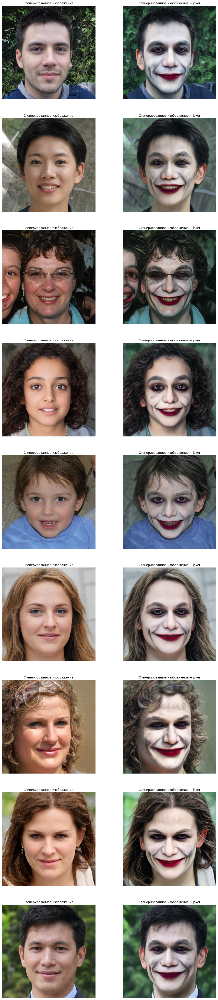

In [12]:
N_SAMPLES = 9
inference_model_on_generated(net_trained, N_SAMPLES)

## Inference on real images

(with e4e)

Real images are inverted to the latent space with e4e encoder and then edited with the trained model

You can try it on your image: upload the image and set `IMAGE_PATH` to its path

Aligned image has shape: (256, 256)
Orig aligned VS edited


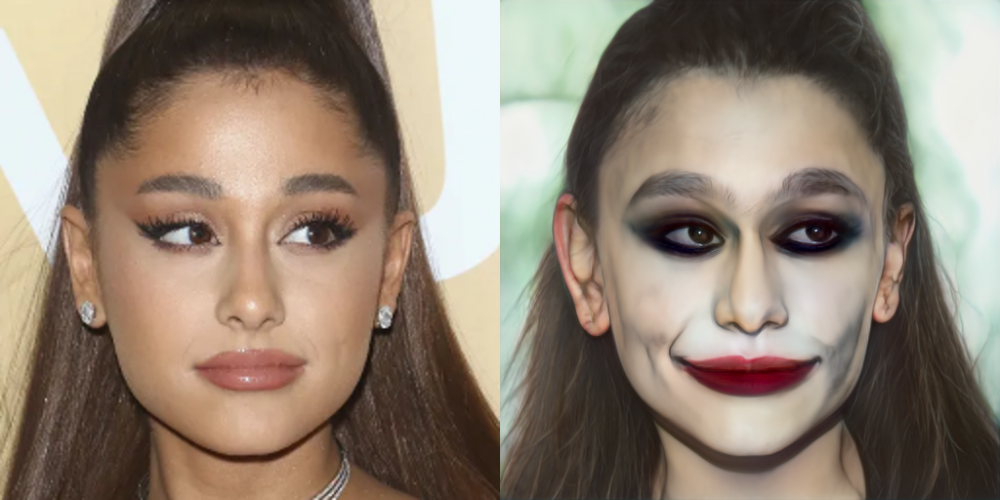

In [17]:
IMAGE_PATH = "/content/ariana-grande.jpg"
sampled_src, sampled_dst, input_image = inference_model_on_real(net_trained, restyle_net, restyle_experiment_args, opts, IMAGE_PATH)

Aligned image has shape: (256, 256)
Orig aligned VS edited


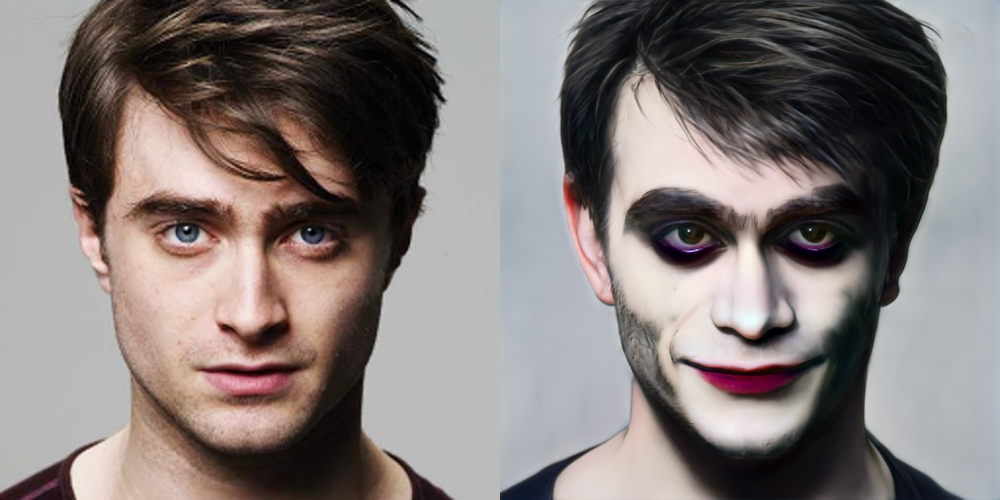

In [18]:
IMAGE_PATH = "/content/Daniel Radicliffe.jpeg"
sampled_src, sampled_dst, input_image = inference_model_on_real(net_trained, restyle_net, restyle_experiment_args, opts, IMAGE_PATH)

Aligned image has shape: (256, 256)
Orig aligned VS edited


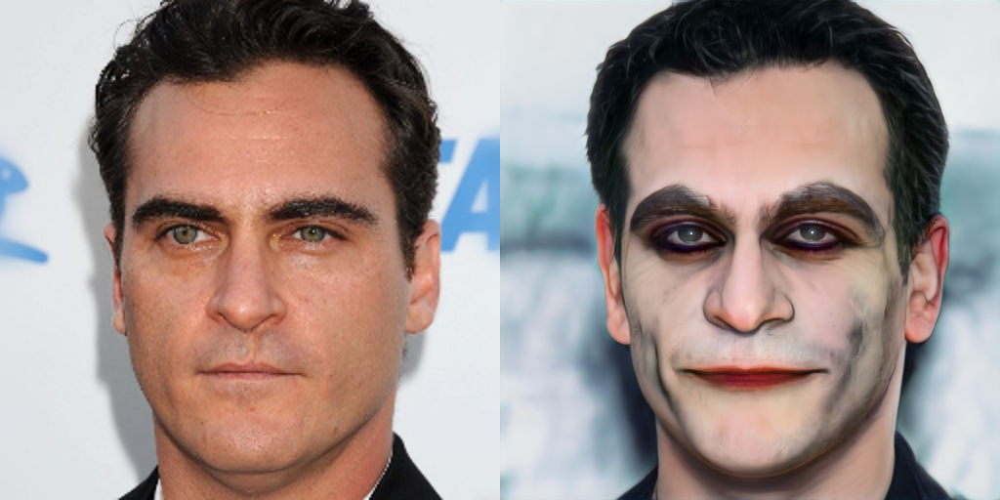

In [19]:
IMAGE_PATH = "/content/Joaquin Phoenix.jpeg"
sampled_src, sampled_dst, input_image = inference_model_on_real(net_trained, restyle_net, restyle_experiment_args, opts, IMAGE_PATH)